$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 2: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [2]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File /home/idan.menashe/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /home/idan.menashe/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /home/idan.menashe/.pytorch-datasets/lfw/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [3]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


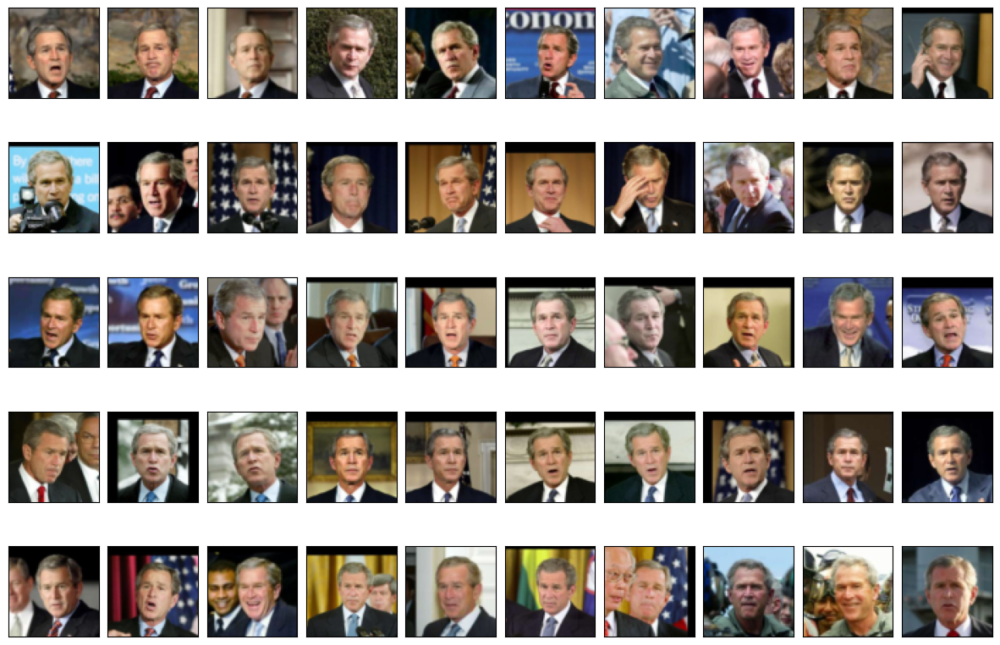

In [4]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [6]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (discriminator): Sequential(
    (0): Conv2d(3, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (6): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(512, 1024, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (9): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): Conv2d(1024, 1, kernel_size=(4, 4), stride=(1, 1))
  )
)
torch.Size([1, 1])


**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [7]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (generator): Sequential(
    (0): ConvTranspose2d(128, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 3, kernel

### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [8]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [9]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

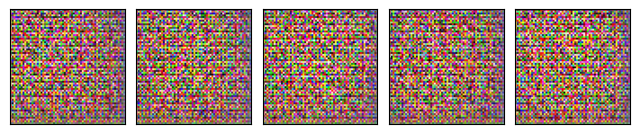

In [10]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [11]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 30, 'z_dim': 100, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.00015, 'betas': (0.5, 0.999)}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.00015, 'betas': (0.5, 0.999)}, 'data_label': 0, 'label_noise': 0.01}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|██████████| 18/18 [00:09<00:00,  1.91it/s]
Discriminator loss: 0.038916344883748226
Generator loss:     21.820531878827598


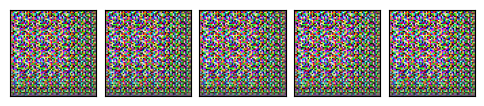

--- EPOCH 2/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.35it/s]
Discriminator loss: 0.30156803499752033
Generator loss:     14.23712177345255


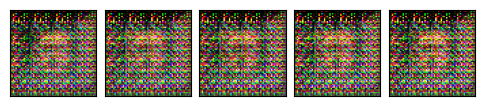

--- EPOCH 3/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.34it/s]
Discriminator loss: 0.6931531600033244
Generator loss:     3.5023770852842264


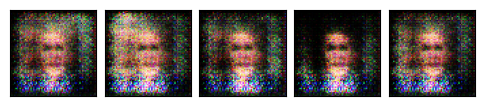

--- EPOCH 4/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.34it/s]
Discriminator loss: 0.6046328379048241
Generator loss:     0.6506223943498399


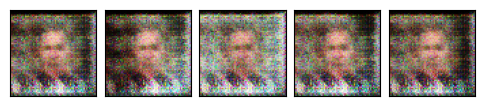

--- EPOCH 5/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.33it/s]
Discriminator loss: 0.4763448586066564
Generator loss:     0.947045213646359


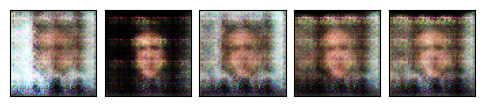

--- EPOCH 6/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.29it/s]
Discriminator loss: 0.515393528673384
Generator loss:     0.6340706613328722


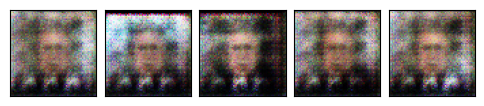

--- EPOCH 7/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.32it/s]
Discriminator loss: 0.3939923776520623
Generator loss:     0.7981735683149762


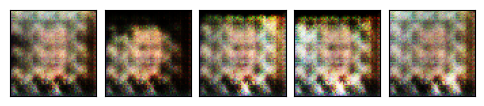

--- EPOCH 8/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.29it/s]
Discriminator loss: 0.38023531271351707
Generator loss:     0.8101836327049468


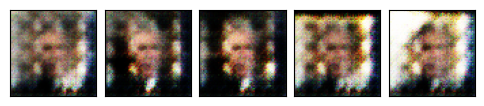

--- EPOCH 9/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.37172484232319725
Generator loss:     0.7148502618074417


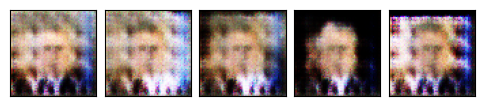

--- EPOCH 10/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.23it/s]
Discriminator loss: 0.33272039228015476
Generator loss:     0.6655168417427275


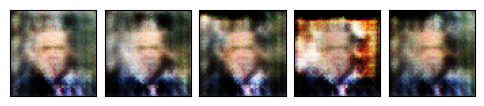

--- EPOCH 11/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.3761428983675109
Generator loss:     0.7328170703517066


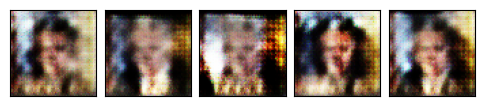

--- EPOCH 12/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.3884670121802224
Generator loss:     0.8245135827196969


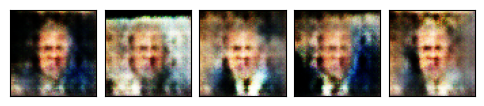

--- EPOCH 13/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.36699964188867146
Generator loss:     0.9116939670509763


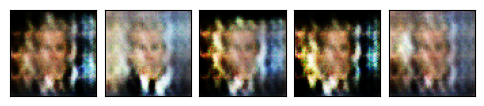

--- EPOCH 14/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.31723153011666405
Generator loss:     0.8378480358256234


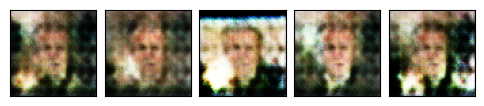

--- EPOCH 15/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.3150523495342996
Generator loss:     0.9993694176276525


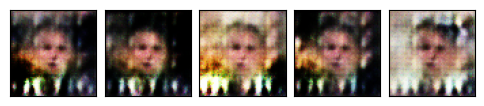

--- EPOCH 16/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.3070567076404889
Generator loss:     0.9691292411751218


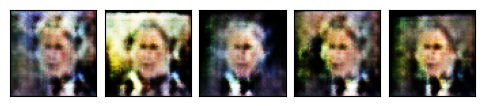

--- EPOCH 17/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.24it/s]
Discriminator loss: 0.3013476754228274
Generator loss:     0.9264345268408457


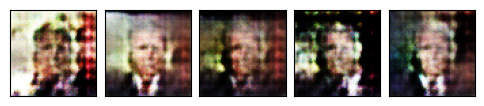

--- EPOCH 18/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.28220564499497414
Generator loss:     1.0197247962156932


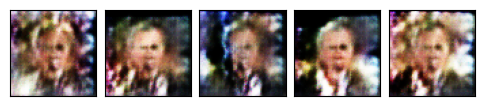

--- EPOCH 19/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.2860206903682815
Generator loss:     0.9140485690699683


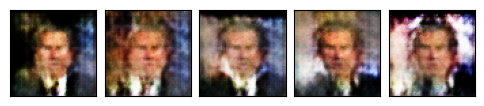

--- EPOCH 20/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.2683221267329322
Generator loss:     0.8802259978320863


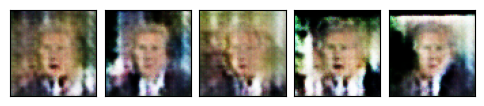

--- EPOCH 21/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.2660986963245604
Generator loss:     0.901661624511083


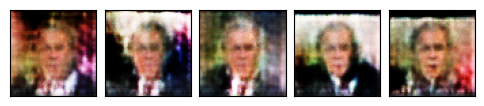

--- EPOCH 22/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.2910367482238346
Generator loss:     0.9309095806545682


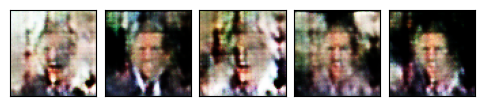

--- EPOCH 23/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.25414422071642345
Generator loss:     0.9452024317449994


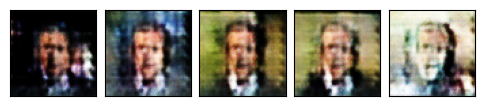

--- EPOCH 24/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.26869450757900876
Generator loss:     0.9930465651883019


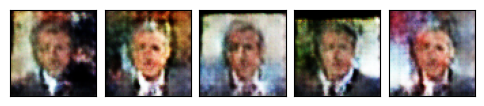

--- EPOCH 25/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.21it/s]
Discriminator loss: 0.23812612311707604
Generator loss:     1.0409311337603464


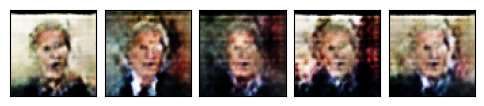

--- EPOCH 26/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.22657481084267297
Generator loss:     1.0058062738842435


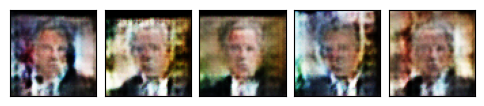

--- EPOCH 27/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.25it/s]
Discriminator loss: 0.213393647223711
Generator loss:     1.0840973456700642


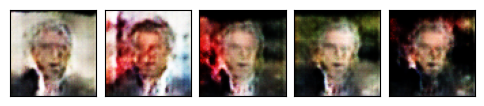

--- EPOCH 28/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
Discriminator loss: 0.17891745186514324
Generator loss:     1.1517539852195315


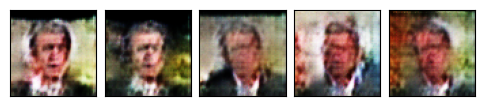

--- EPOCH 29/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.25it/s]
Discriminator loss: 0.18962952577405506
Generator loss:     1.1380634539657168


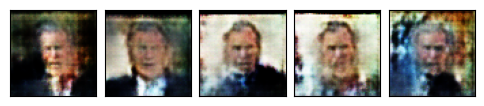

--- EPOCH 30/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.18071428562204042
Generator loss:     1.2826723671621747


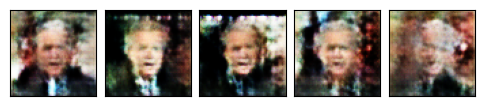

--- EPOCH 31/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.22629139282637173
Generator loss:     1.0272601693868637
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


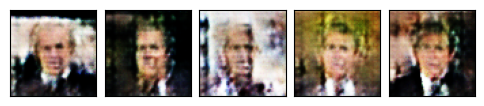

--- EPOCH 32/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.24it/s]
Discriminator loss: 0.203642381562127
Generator loss:     1.1226930651399825


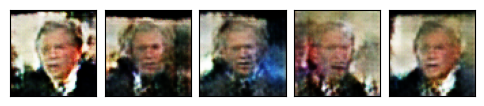

--- EPOCH 33/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.15101563351021874
Generator loss:     1.2686924851602979


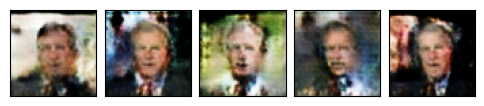

--- EPOCH 34/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
Discriminator loss: 0.16144351868165863
Generator loss:     1.35934692952368


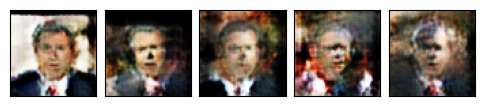

--- EPOCH 35/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.13443370246224934
Generator loss:     1.397135368651814


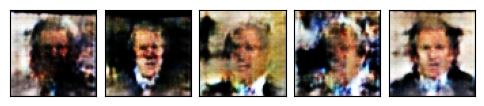

--- EPOCH 36/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
Discriminator loss: 0.17190064158704546
Generator loss:     1.5115691588984594


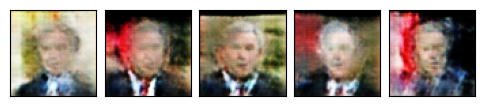

--- EPOCH 37/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.15476922235555118
Generator loss:     1.5090194659100638


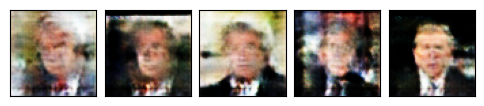

--- EPOCH 38/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
Discriminator loss: 0.11858317049013244
Generator loss:     1.3334137598673503


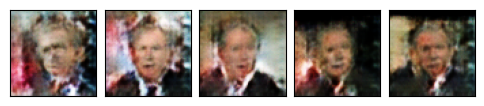

--- EPOCH 39/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.08535394962463114
Generator loss:     1.6257667740186055


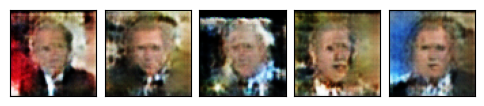

--- EPOCH 40/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.09973708064191872
Generator loss:     1.7326936225096385


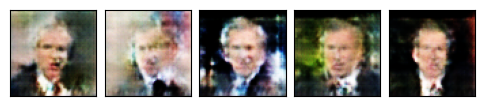

--- EPOCH 41/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.11663245099286239
Generator loss:     1.8700296547677782


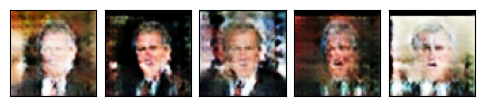

--- EPOCH 42/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
Discriminator loss: 0.080532174040046
Generator loss:     1.83855159746276


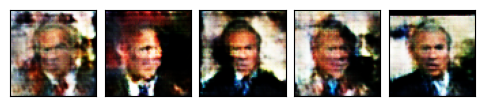

--- EPOCH 43/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.08875694105194674
Generator loss:     1.777565018998252


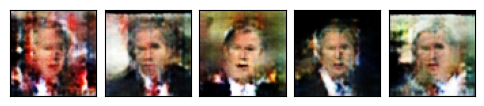

--- EPOCH 44/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.09205617962612046
Generator loss:     1.6993972758452098


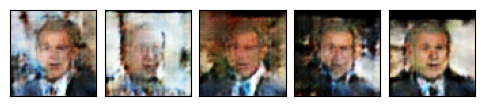

--- EPOCH 45/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.07235224141428868
Generator loss:     2.0847714758581586


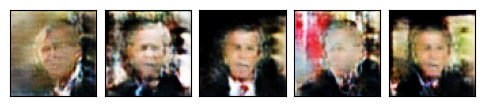

--- EPOCH 46/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.10118546357585324
Generator loss:     2.0974998507234783


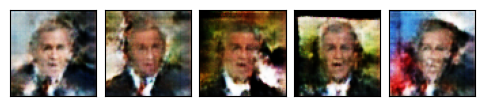

--- EPOCH 47/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.07551621562904781
Generator loss:     1.8402057356304593


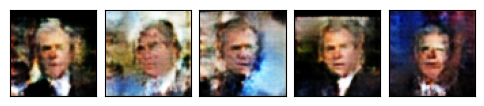

--- EPOCH 48/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.06620629680239493
Generator loss:     2.150996959871716


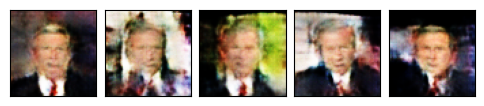

--- EPOCH 49/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.21it/s]
Discriminator loss: 0.08342236001044512
Generator loss:     2.253216670619117


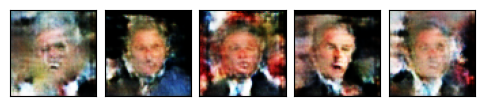

--- EPOCH 50/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.20it/s]
Discriminator loss: 0.07363102750645743
Generator loss:     2.2718554172250958


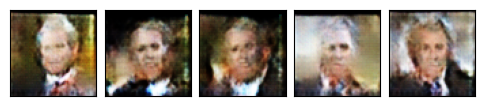

--- EPOCH 51/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.05633253479997317
Generator loss:     2.6423387196328907


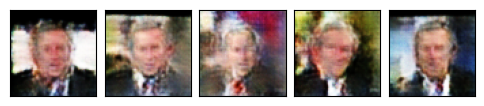

--- EPOCH 52/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.0505432209206952
Generator loss:     2.6195802688598633


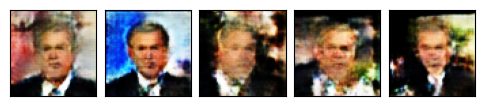

--- EPOCH 53/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
Discriminator loss: 0.04560987879004744
Generator loss:     2.582969364192751


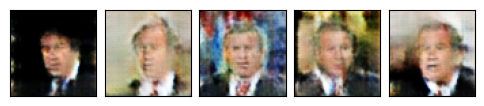

--- EPOCH 54/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.23it/s]
Discriminator loss: 0.05551485934605201
Generator loss:     2.7665703462229834


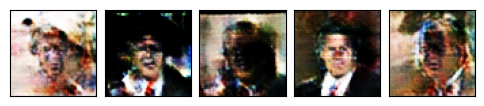

--- EPOCH 55/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.03308182357189556
Generator loss:     2.58558228943083


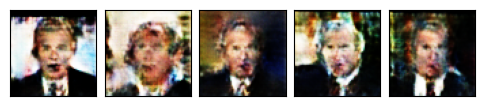

--- EPOCH 56/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.29it/s]
Discriminator loss: 0.050343025372260146
Generator loss:     2.924839119116465


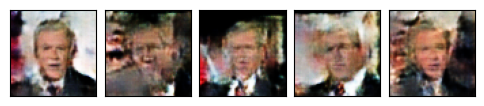

--- EPOCH 57/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.0465526143865039
Generator loss:     2.876139005025228


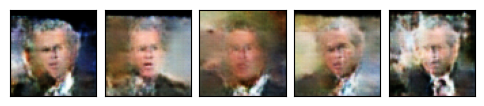

--- EPOCH 58/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.04107001185831097
Generator loss:     3.085920992824766


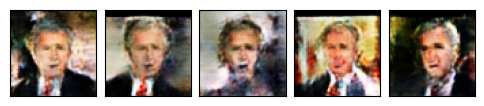

--- EPOCH 59/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.037815248800648585
Generator loss:     3.1090172198083668


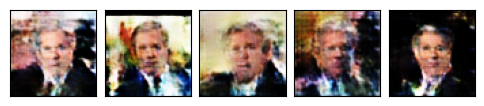

--- EPOCH 60/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.25it/s]
Discriminator loss: 0.044486946581552424
Generator loss:     2.5626316931512623
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


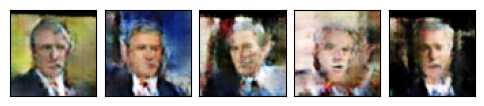

--- EPOCH 61/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.21it/s]
Discriminator loss: 0.05284963372266955
Generator loss:     2.655289808909098
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


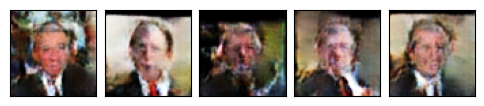

--- EPOCH 62/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.22it/s]
Discriminator loss: 0.040494809185879097
Generator loss:     3.187966697745853


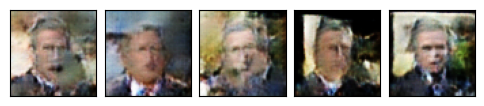

--- EPOCH 63/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.03188305588749548
Generator loss:     3.4423684212896557


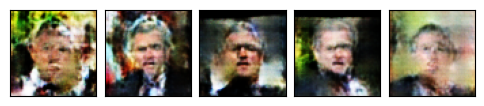

--- EPOCH 64/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.02961472923763924
Generator loss:     3.134204924106598


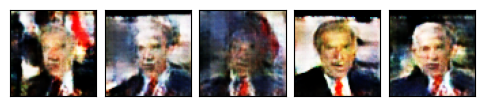

--- EPOCH 65/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.030889964959998097
Generator loss:     3.129573689566718


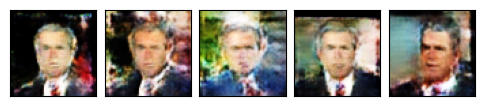

--- EPOCH 66/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.028758574251292482
Generator loss:     3.81276136636734


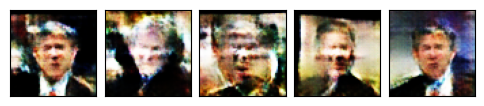

--- EPOCH 67/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.24it/s]
Discriminator loss: 0.0198072695121583
Generator loss:     3.8484649194611444


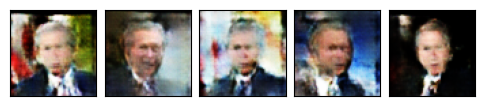

--- EPOCH 68/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.029059860700120527
Generator loss:     3.5329661634233265


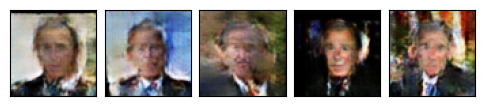

--- EPOCH 69/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.25it/s]
Discriminator loss: 0.030231035547330976
Generator loss:     3.4167430798212686


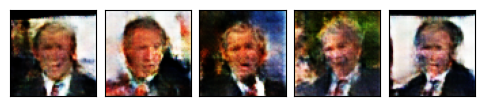

--- EPOCH 70/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.025716997476087675
Generator loss:     3.862898369630178


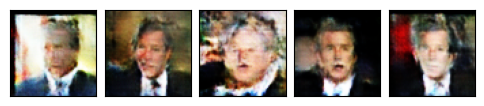

--- EPOCH 71/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.023318408108833764
Generator loss:     4.385705325338575


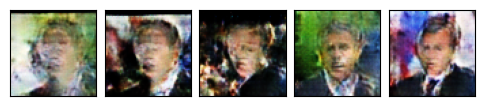

--- EPOCH 72/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.023982973924527567
Generator loss:     3.5091540217399597


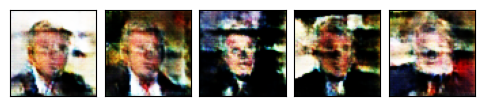

--- EPOCH 73/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.027178003607938688
Generator loss:     3.426560726430681


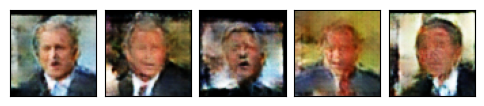

--- EPOCH 74/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.025667591693086758
Generator loss:     3.7032304869757757


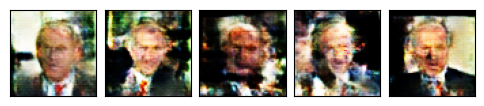

--- EPOCH 75/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.03798198080362959
Generator loss:     3.7118901676601834
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


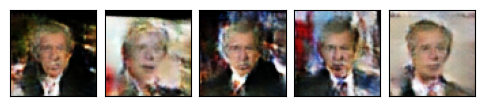

--- EPOCH 76/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.020844802441489365
Generator loss:     3.8980297115114


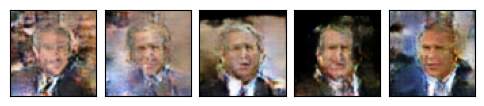

--- EPOCH 77/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.25it/s]
Discriminator loss: 0.01854820536553032
Generator loss:     4.4615011016527815


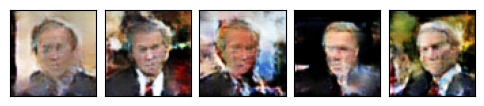

--- EPOCH 78/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
Discriminator loss: 0.021776814524653472
Generator loss:     4.653487278355493


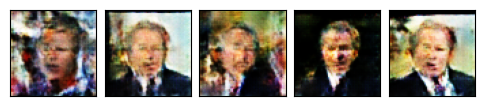

--- EPOCH 79/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.04735979215345449
Generator loss:     3.503016948699951
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


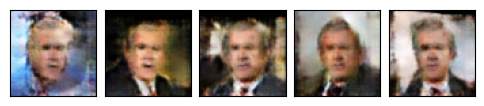

--- EPOCH 80/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.23it/s]
Discriminator loss: 0.03542393813323644
Generator loss:     3.5506992406315274


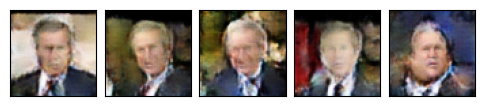

--- EPOCH 81/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
Discriminator loss: 0.034854144944498934
Generator loss:     4.379659844769372


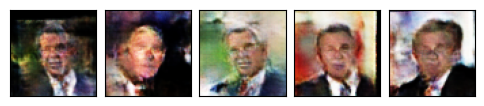

--- EPOCH 82/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.25it/s]
Discriminator loss: 0.01796340979894416
Generator loss:     4.757389591799842


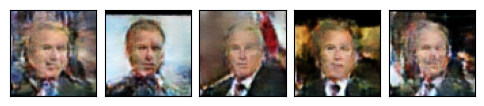

--- EPOCH 83/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.025027212402265932
Generator loss:     4.5938557452625695


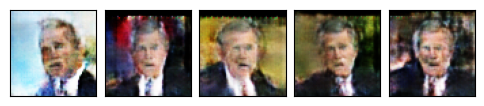

--- EPOCH 84/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.037474097373584904
Generator loss:     3.6379941602547965
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


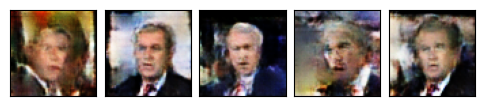

--- EPOCH 85/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.03626696998253465
Generator loss:     4.297516312864092


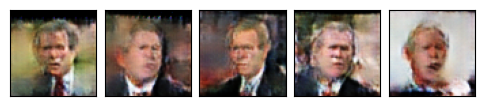

--- EPOCH 86/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.027668507148822147
Generator loss:     4.619047946400112


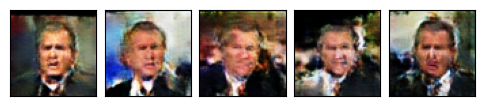

--- EPOCH 87/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.016510998028227024
Generator loss:     5.530430952707927


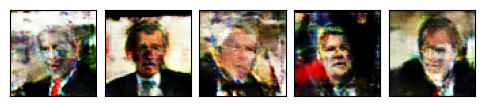

--- EPOCH 88/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.026843558764085174
Generator loss:     4.2573103706041975


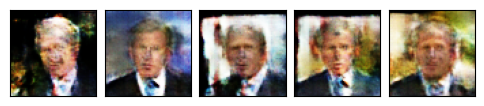

--- EPOCH 89/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.02659343823324889
Generator loss:     4.447709189520942


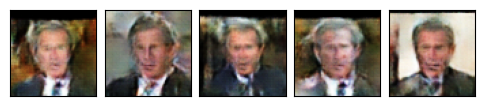

--- EPOCH 90/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.03273611554565529
Generator loss:     4.897121005588108
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


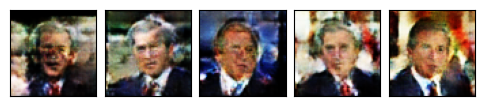

--- EPOCH 91/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.02461573916176955
Generator loss:     4.226452860567305


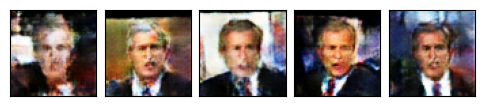

--- EPOCH 92/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.25it/s]
Discriminator loss: 0.025921843557928998
Generator loss:     4.7811555994881525


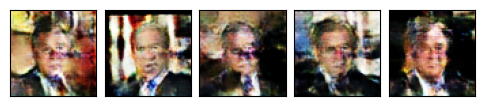

--- EPOCH 93/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.017377219719087914
Generator loss:     4.958090835147434


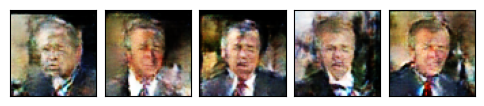

--- EPOCH 94/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.25it/s]
Discriminator loss: 0.00902182159997109
Generator loss:     5.647475295596653


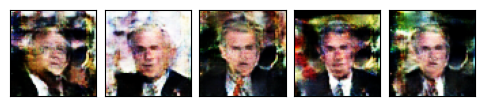

--- EPOCH 95/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
Discriminator loss: 0.009793281788006425
Generator loss:     5.647117111417982


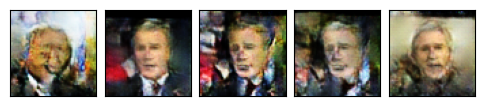

--- EPOCH 96/100 ---
100%|██████████| 18/18 [00:08<00:00,  2.24it/s]
Discriminator loss: 0.008239370854830163
Generator loss:     6.4447872506247625


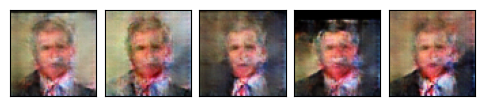

--- EPOCH 97/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.25it/s]
Discriminator loss: 0.03539926196551985
Generator loss:     6.330480509334141
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


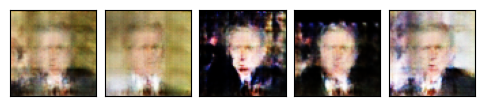

--- EPOCH 98/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.26it/s]
Discriminator loss: 0.042251398191890784
Generator loss:     5.1256534987025795
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


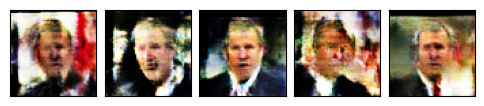

--- EPOCH 99/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.27it/s]
Discriminator loss: 0.04754799133580592
Generator loss:     5.47224760055542
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


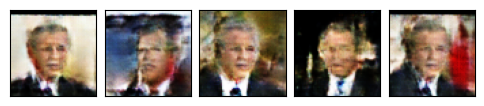

--- EPOCH 100/100 ---
100%|██████████| 18/18 [00:07<00:00,  2.28it/s]
Discriminator loss: 0.05108520031596223
Generator loss:     5.293266812960307
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


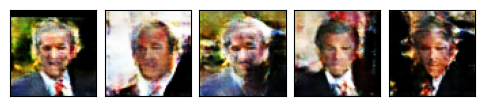

In [12]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

/tmp/ipykernel_89948/1746051416.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  gen = torch.load(f'{checkpoint_file}.pt', map_location=device)


*** Images Generated from best model:


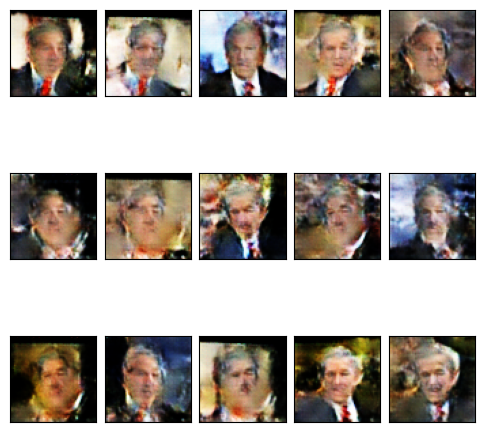

In [13]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [14]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [15]:
display_answer(hw3.answers.part2_q1)


**Your answer:**
Gradients are maintained during the generator training because its parameters need to be updated based on the discriminator's feedback. They are discarded during the discriminator training since we only need to update the discriminator's parameters, and the generator's output is treated as fixed and shouldn’t be trained here.




### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [16]:
display_answer(hw3.answers.part2_q2)


**Your answer:**
No, you shouldn't stop training a GAN just because the generator loss is low, as this might not mean the generated images are good. They could be repetitive or of poor quality. 
If the discriminator loss stays constant while the generator loss drops, it might indicate that the generator is finding tricks to fool the discriminator without truly improving. This could lead to a situation where the GAN isn't creating diverse and improving images, even though the losses seem to suggest progress.



### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [17]:
display_answer(hw3.answers.part2_q3)


**Your answer:**



